<img src="https://upload.wikimedia.org/wikipedia/commons/4/47/Logo_UTFSM.png" width="200" alt="utfsm-logo" align="left"/>

# MAT281
### Aplicaciones de la Matemática en la Ingeniería

## Proyecto 02: Free Style

### Instrucciones

* Completa tus datos personales (nombre y rol USM) en siguiente celda.
* Debes _pushear_ tus cambios a tu repositorio personal del curso.
* Como respaldo, debes enviar un archivo .zip con el siguiente formato `mXX_projectYY_apellido_nombre.zip` a alonso.ogueda@gmail.com, debe contener todo lo necesario para que se ejecute correctamente cada celda, ya sea datos, imágenes, scripts, etc.
* Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

__Nombre__: Tomás Tapia C.

__Rol__: 201711049-K

## Prediciendo _Pulsars_

Un púlsar (del acrónimo en inglés de pulsating star, que significa «estrella que emite radiación muy intensa a intervalos cortos y regulares») es una estrella de neutrones que emite radiación periódica. Los púlsares poseen un intenso campo magnético que induce la emisión de estos pulsos de radiación electromagnética a intervalos regulares relacionados con el periodo de rotación del objeto. [Wikipedia](https://es.wikipedia.org/wiki/P%C3%BAlsar).

![pulsar](https://upload.wikimedia.org/wikipedia/commons/thumb/c/c9/Chandra-crab.jpg/600px-Chandra-crab.jpg)

_A composite image of the Crab Nebula showing the X-ray (blue), and optical (red) images superimposed. The size of the X-ray image is smaller because the higher energy X-ray emitting electrons radiate away their energy more quickly than the lower energy optically emitting electrons as they move._

### Descripción de los datos

In [1]:
!cat data/Readme.txt

"cat" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


### Objetivo

El objetivo es a partir de los datos, hacer la mejor predicción si un registro es un __pulsar__ o no. Para ellos es necesario realizar los pasos clásicos de un proyecto de _Machine Learning_, como estadística descriptiva, visualización y preprocesamiento. Sin embargo, se busca escoger el mejor modelo de clasificación con una métrica específica (_precision_).

* Se solicita ajustar tres modelos de clasificación, una regresión logística, KNN y un tercero a elección del siguiente [link](https://scikit-learn.org/stable/supervised_learning.html#supervised-learning) (es obligación escoger un _estimator_ que tenga por lo menos un hiperparámetro). 
* En los modelos que posean hiperparámetros es mandatorio buscar el/los mejores con alguna técnica disponible en `scikit-learn` ([ver más](https://scikit-learn.org/stable/modules/grid_search.html#tuning-the-hyper-parameters-of-an-estimator)).
* Para cada modelo, se debe realizar _Cross Validation_ con 10 _folds_ utilizando los datos de entrenamiento con tal de determinar un intervalo de confianza para el _score_ del modelo.
* Finalmente, realizar una predicción con cada uno de los tres modelos con los datos _test_ y obtener el _score_. 

En este informe __siempre__ debes utilizar _score_ / _scoring_ la métrica [_precision_](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html#sklearn.metrics.precision_score), tanto para el _Cross Validation_, _Hyper Parameter Tuning_ y _Prediction_. Toda la información al respecto de las métricas se encuentra [aquí](https://scikit-learn.org/stable/modules/model_evaluation.html#metrics-and-scoring-quantifying-the-quality-of-predictions). 

### Evaluación

Este jupyter notebook debe ser autocontenido, considera que es un informe técnico donde debes detallar cada paso, comentando código, utilizando variables con nombres adecuados, realizando gráficos y agregando apreciaciones personales cuando sea necesario. __No escatimes recursos a la hora de escribir.__

__Escenario:__ Te encuentras trabajando como _data scientist / data analyst / machine learning engineer / etc._ y este trabajo será presentado al resto del equipo, en especial a tu jefe directo. Todos tienen conocimiento del problema y de machine learning, por lo que no puedes pasar por alto los aspectos técnicos de tu desarrollo. __Al final del informe, debes entregar tus conclusiones, visualizaciones y apreciaciones personales.__

__Preguntas a responder:__

* ¿Cuál modelo tiene mejor _precision_?
* ¿Cuál modelo demora menos tiempo en ajustarse?
* ¿Qué modelo escoges?
* ¿Por qué utilizar _precision_ y no otro score?


### Rúbrica

* __Estadística Descriptiva__ (5 pts)
* __Visualización__ (10 pts)
* __Preprocesamineto__ (5 pts)
* __Regresión Logística__ (10 pts)
* __K Nearest Neighbours__ (15 pts)
* __Modelo a elección__ (15 pts)
* __Selección de Modelos__ (20 pts)
* __Conclusiones__ (20 pts)

## Contenidos

* [Estadística Descriptiva](#descr_stat)
* [Visualización](#visualization)
* [Preprocesamineto](#preprocessing)
* [Regresión Logística](#logistic)
* [K Nearest Neighbours](#knn)
* [Modelo a elección](#free-style)
* [Selección de Modelos](#model-selection)
* [Conclusiones](#conclusions)

In [2]:
import os
import numpy as np
import pandas as pd

In [3]:
df = pd.read_csv(
    os.path.join("data", "HTRU_2.csv"),
    header=None,
    names=[
        "mean_integrated_profile",
        "std_integrated_profile",
        "excess_kurtosis_integrated_profile",
        "skewness_integrated_profile",
        "mean_dmsnr",
        "std_dmsnr",
        "excess_kurtosis_dmsnr",
        "skewness_dmsnr",
        "is_pulsar",
    ]
)
df.head()

,mean_integrated_profile,std_integrated_profile,excess_kurtosis_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,excess_kurtosis_dmsnr,skewness_dmsnr,is_pulsar
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0


<a id='descr_stat'></a>

## Estadística Descriptiva

* Dar una pequeña definición de las columnas (_features_).
* Análisis descriptivo.
* Valores atípicos.
* Análisis específico a la variable _target_.

## Análisis descriptivo

In [4]:
df.describe(include="all").T

,count,mean,std,min,25%,50%,75%,max
mean_integrated_profile,17898.0,111.079968,25.652935,5.812500,100.929688,115.078125,127.085938,192.617188
std_integrated_profile,17898.0,46.549532,6.843189,24.772042,42.376018,46.947479,51.023202,98.778911
excess_kurtosis_integrated_profile,17898.0,0.477857,1.064040,-1.876011,0.027098,0.223240,0.473325,8.069522
skewness_integrated_profile,17898.0,1.770279,6.167913,-1.791886,-0.188572,0.198710,0.927783,68.101622
mean_dmsnr,17898.0,12.614400,29.472897,0.213211,1.923077,2.801839,5.464256,223.392140
std_dmsnr,17898.0,26.326515,19.470572,7.370432,14.437332,18.461316,28.428104,110.642211
excess_kurtosis_dmsnr,17898.0,8.303556,4.506092,-3.139270,5.781506,8.433515,10.702959,34.539844
skewness_dmsnr,17898.0,104.857709,106.514540,-1.976976,34.960504,83.064556,139.309331,1191.000837
is_pulsar,17898.0,0.091574,0.288432,0.000000,0.000000,0.000000,0.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17898 entries, 0 to 17897
Data columns (total 9 columns):
mean_integrated_profile               17898 non-null float64
std_integrated_profile                17898 non-null float64
excess_kurtosis_integrated_profile    17898 non-null float64
skewness_integrated_profile           17898 non-null float64
mean_dmsnr                            17898 non-null float64
std_dmsnr                             17898 non-null float64
excess_kurtosis_dmsnr                 17898 non-null float64
skewness_dmsnr                        17898 non-null float64
is_pulsar                             17898 non-null int64
dtypes: float64(8), int64(1)
memory usage: 1.2 MB


In [6]:
for col in df:
    if col=='is_pulsar':
        print(f"La columna {col} posee {len(df[col].sort_values().unique())} valores únicos \n\n")
        print(f"Los cuales son {df[col].sort_values().unique()} ")

La columna is_pulsar posee 2 valores únicos 


Los cuales son [0 1] 


* Podemos ver que son 9 columnas.
* 8 de ellas son del tipo _float64_ con valores numericos para cada variable medida.
    * Columna `mean_integrated_profile`  hay 17.898 valores no nulos.
    * Columna `std_integrated_profile`  hay 17.898 valores no nulos.
    * Columna `excess_kurtosis_integrated_profile`  hay 17.898 valores no nulos.
    * Columna `skewness_integrated_profile`  hay 17.898 valores no nulos.
    * Columna `mean_dmsnr`  hay 17.898 valores no nulos.
    * Columna `std_dmsnr`  hay 17.898 valores no nulos.
    * Columna `excess_kurtosis_dmsnr`  hay 17.898 valores no nulos.
    * Columna `skewness_dmsnr`  hay 17.898 valores no nulos.
* 1 de ellas es del tipo _int32_. Donde esta es la variable _target_.
    * Columna `is_pulsar` hay 17.898 valore no nulos
    * Los unicos valores son: 0 (no es pulsar); 1 (es pulsar).
* En este dataset hay 1.639 datos reales de pulsars y 16.259 datos obtenidos de RFI/noise.
* La memoria usada 1.2 MB

<a id='visualization'></a>

## Visualización

* Histogramas.
* Scatter matrix coloreando por el _target_.
* Mapa de calor con correlación entre variables.

Puedes utilizar `matplotlib` o `altair`, como sea de tu preferencia.

In [7]:
import altair as alt
import matplotlib.pyplot as plt

alt.themes.enable("opaque")

%matplotlib inline

alt.data_transformers.disable_max_rows() # Para trabajar con más de 5000 datos en altair

DataTransformerRegistry.enable('default')

In [8]:
columns_list = list(df.keys())
columns_list.remove('is_pulsar')

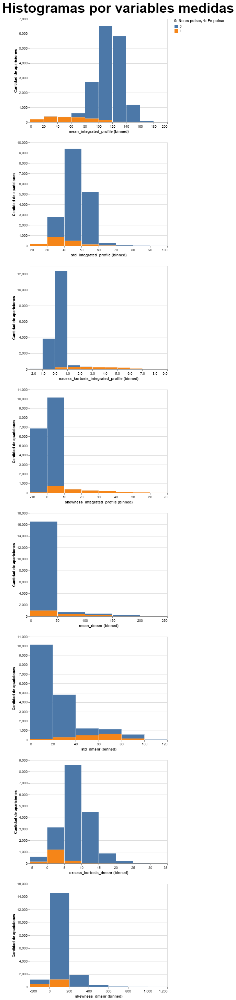

In [9]:
alt.Chart(df).mark_bar().encode(
    x=alt.X(alt.repeat('row'), type='quantitative', bin=True),
    y=alt.Y('count():Q', axis=alt.Axis(title='Cantidad de apariciones')),
    color=alt.Color('is_pulsar:N', title='0: No es pulsar, 1: Es pulsar')
    ).repeat(
    row=columns_list,
    title=alt.TitleParams(text='Histogramas por variables medidas', align='center', anchor='middle',fontSize=40))

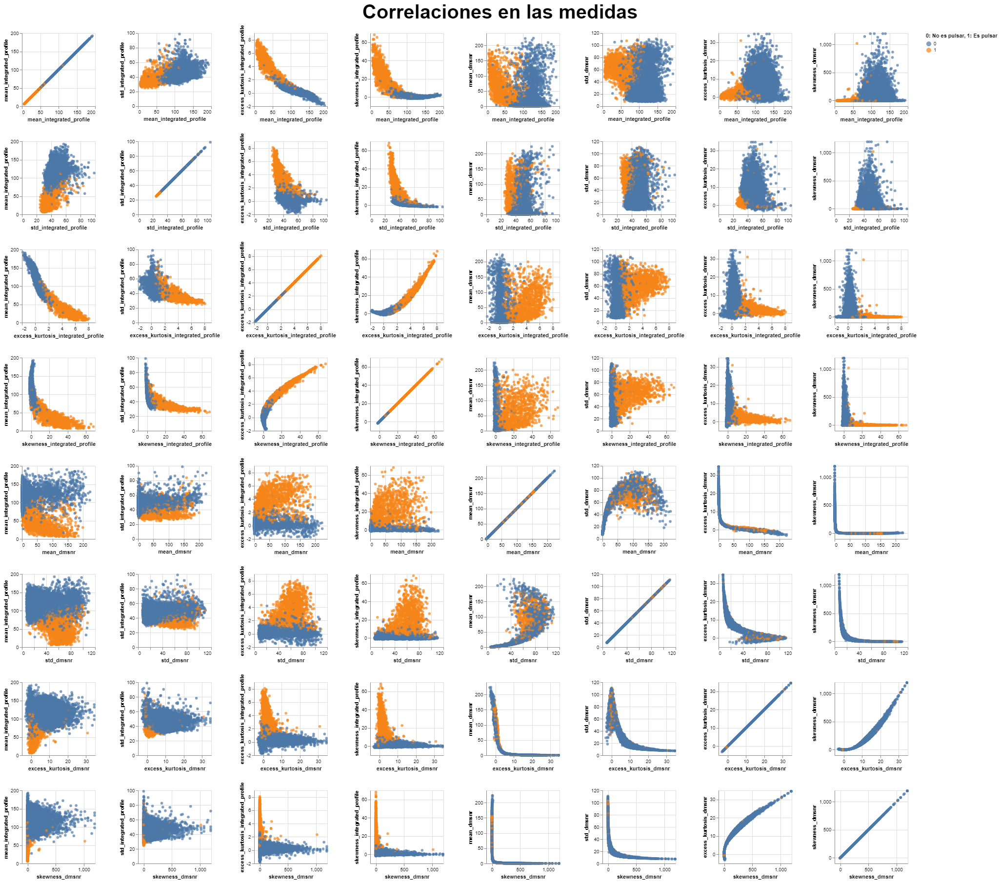

In [10]:
alt.Chart(df).mark_circle().encode(
    x=alt.X(alt.repeat('row'), type='quantitative'),
    y=alt.Y(alt.repeat('column'), type='quantitative'),
    color=alt.Color('is_pulsar:N', title='0: No es pulsar, 1: Es pulsar')
    ).properties(
    height=150,
    width=150
).repeat(
    row=columns_list,
    column=columns_list,
    title=alt.TitleParams(text='Correlaciones en las medidas', align='center', anchor='middle',fontSize=40)
    )

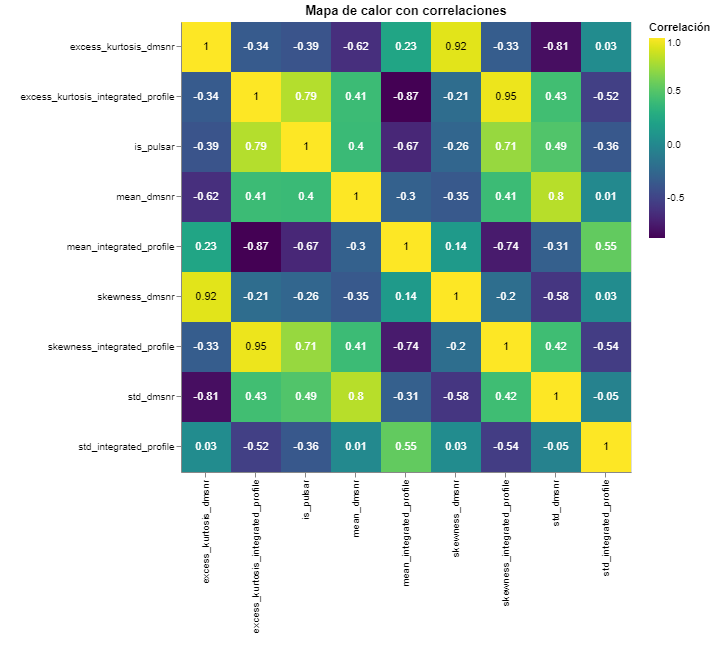

In [11]:
df_corr = df.corr().round(2).reset_index().rename(
                columns = {'index':'medida_1'}).melt(
                                                    id_vars = ['medida_1'],
                                                    value_name = 'correlacion',
                                                    var_name = 'medida_2'
                                                    )

heatmap= alt.Chart(df_corr).mark_rect().encode(
        alt.X('medida_1:N', title=' '),
        alt.Y('medida_2:N', title=' '),
        alt.Color('correlacion:Q', title='Correlación', scale=alt.Scale(scheme='viridis'))
).properties(
    height=450,
    width=450,
    title=alt.TitleParams(text='Mapa de calor con correlaciones')
)
texto = heatmap.mark_text(baseline='middle').encode(
    text='correlacion:Q',
    color=alt.condition(
        alt.datum.correlacion >= 0.90,
        alt.value('black'),
        alt.value('white')
    ))
heatmap + texto

<a id='preprocessing'></a>

## Preprocesamiento

Es hora de preparar los datos para la selección de modelos. Se solicita que:

* Crear el _numpy.array_ `X_raw` con las columnas predictoras de `df`.
* Crear el _numpy.array_ `y` con la columna a predecir de `df`.
* Definir un _transformer_ `StandarScaler` declarado como `scaler`, luego ajustar con los datos de `X_raw`.
* Definir el _numpy.array_ `X` luego de transformar los datos de `X_raw` con `scaler`. Verificar que tenga media nula y desviación estándar unitaria.
* Dividir la data en _train_ (90%) y _test_ (10%) utilizando como argumento `random_state=42`.

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [13]:
X_raw = df.drop(['is_pulsar'], axis=1).values
y = df['is_pulsar'].values

In [14]:
scaler = StandardScaler()
X = scaler.fit_transform(X_raw)

In [37]:
print(f"La media es {np.mean(X):.2f} y la desviación es {np.std(X):.2f}")

La media es 0.00 y la desviación es 1.00


In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

<a id='logistic'></a>

## Regresión Logística

Utiliza la función `cross_validate` con el estimador `logistic` para realizar una estimación del _score_

In [18]:
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression

In [47]:
logistic = LogisticRegression(solver='lbfgs')
logistic_cv = cross_validate(logistic,X_train, y_train, scoring='precision', cv=10)

In [59]:
print(f'Logistic Regression Cross Validation precision score: {np.mean(logistic_cv["test_score"]):.3f} +/- {np.std(logistic_cv["test_score"]):.3f}')

Logistic Regression Cross Validation precision score: 0.941 +/- 0.017


In [49]:
logistic.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

<a id='knn'></a>

## K Nearest Neighbours

Utiliza `GridSearchCV` para encontrar el mejor valor de `n_neighbors`. Luego, con el mejor _estimator_ de `knn` realiza la validación cruzada para obtener el intervalo de confianza del _score_.

In [22]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [23]:
parameters = np.arange(1, 50)
para_grid={'n_neighbors': parameters}
df_gscv = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=para_grid)
df_gscv.fit(X_train, y_train)
df_gscv.best_params_

C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'n_neighbors': 7}

In [24]:
knn = KNeighborsClassifier(n_neighbors=df_gscv.best_params_['n_neighbors'])
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                     weights='uniform')

In [50]:
knn_cv = cross_validate(knn, X_train, y_train, scoring='precision', cv=10)

In [58]:
print(f'KNN Cross Validation precision score: {np.mean(knn_cv["test_score"]):.3f} +/- {np.std(knn_cv["test_score"]):.3f} with train data.')

KNN Cross Validation precision score: 0.932 +/- 0.018 with train data.


<a id='free_style'></a>

## Modelo a elección

* Escoge un modelo de clasificación de [aquí](https://scikit-learn.org/stable/supervised_learning.html#supervised-learning) que por lo menos tenga un hiperparámetro, por ejemplo, [sklearn.svm.SVC](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC) tiene el parámetro de regularización `C`.
* Explica en uno o dos párrafos en qué consiste el algoritmo/modelo.
* Al igual que KNN, encuentra el/los mejores valores para los hiperparámetros.
* Con el mejor estimador realiza _Cross Validation_ con los datos de entrenamiento.
* Calcula el intervalo de confianza de _precision_.

## C-Support Vector Classification (SVC)

La implementación se basa en libsvm. El tiempo de ajuste se escala al menos cuadráticamente con el número de muestras y puede ser poco práctico más allá de decenas de miles de muestras. El soporte multiclase se maneja de acuerdo con un esquema uno contra uno.

In [27]:
from sklearn.svm import SVC

In [28]:
my_model_pre = SVC(gamma='auto')

In [29]:
parameters = {'kernel':('linear', 'rbf'), 'C':[1, 50]} #Aquí buscaremos que parametros son mejores, para un C entre 1 y 50
clf = GridSearchCV(my_model_pre , parameters)          # y el kernel a usar, entre linear o rbf.
clf.fit(X_train, y_train)
clf.best_params_

C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'C': 50, 'kernel': 'rbf'}

In [52]:
my_model = SVC(C=50, kernel='rbf', gamma='auto')
my_model.fit(X_train, y_train)
my_model_cv = cross_validate(my_model , X_train, y_train, scoring='precision', cv=10)

In [57]:
print(f'MY MODEL Cross Validation precision score: {np.mean(my_model_cv["test_score"]):.3f} +/- {np.std(my_model_cv["test_score"]):.3f} with train data.')

MY MODEL Cross Validation precision score: 0.938 +/- 0.020 with train data.


<a id='model_selection'></a>

## Selección de Modelo

* Compara la _precision_ entre cada uno de los modelos.
* Grafica la matriz de confusión para cada uno de los modelos.
* Calcula un intervalo de confianza del tiempo utilizado en el ajuste de cada modelo. Ver documentación de `cross_validate`.
* Gráficos o reportes adicionales.

In [32]:
from sklearn.metrics import precision_score, classification_report

In [72]:
print(f'Logistic Regression test precision score: {precision_score(y_test,logistic.predict(X_test)):.5f}')
print(f'KNN test precision score: {precision_score(y_test,knn.predict(X_test)):.5f}')
print(f'MY MODEL test precision score: {precision_score(y_test,my_model.predict(X_test)):.5f}')

Logistic Regression test precision score: 0.93571
KNN test precision score: 0.93706
MY MODEL test precision score: 0.96350


## Matriz de confusión

In [63]:
from sklearn.metrics import plot_confusion_matrix

lista = ['logistic', 'knn', 'my_model']
fig,(ax1, ax2,ax3)= plt.subplots(1,3,figsize=(20,20))
lista_2 = ['ax1', 'ax2', 'ax3']
for i in range(0,3):
    plot_confusion_matrix(lista[i], X_test, y_test, ax=lista_2[i], cmap=plt.cm.Blues)
    lista_2[i].set_title(lista[i])
    plt.show()

* Podemos ver que no me sale la matriz, porque nunca pude configurar bien los ambientes, hice todos los pases muchas veces y nada. Como siempre, pongo el código que en teoría debería servir para crearla.

## Intervalo de confianza para el tiempo de ajuste

In [71]:
print(f'Intervalo de confianza en Logistic Regression fit time: {np.mean(cross_validate(logistic ,X_train,y_train)["fit_time"]):.3f} +/- {np.std(cross_validate(logistic,X_train,y_train)["fit_time"]):.3f}')

print(f'Intervalo de confianza en KNeighborsClassifier fit time: {np.mean(cross_validate(knn ,X_train,y_train)["fit_time"]):.3f} +/- {np.std(cross_validate(knn ,X_train,y_train)["fit_time"]):.3f}')

print(f'Intervalo de confianza en My Model SVC fit time: {np.mean(cross_validate(my_model ,X_train,y_train)["fit_time"]):.3f} +/- {np.std(cross_validate(my_model ,X_train,y_train)["fit_time"]):.3f}')

C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Intervalo de confianza en Logistic Regression fit time: 0.040 +/- 0.011


C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Intervalo de confianza en KNeighborsClassifier fit time: 0.006 +/- 0.004


C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Tomas\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


Intervalo de confianza en My Model SVC fit time: 0.711 +/- 0.037


## Score en cada modelo

In [69]:
print(f'Score de Regresión logística: {logistic.score(X_test, y_test):.5f}')
print(f'Score de KNeighbors: {knn.score(X_test, y_test):.5f}')
print(f'Score de My model SVC: {my_model.score(X_test, y_test):.5f}')

Score de Regresión logística: 0.98045
Score de KNeighbors: 0.98212
Score de My model SVC: 0.98324


<a id='conclusions'></a>

## Conclusiones

Entrega tu veredicto, responde las preguntas iniciales, visualizaciones, trabajos futuros, dificultados, etc.

__Preguntas a responder:__

* ¿Cuál modelo tiene mejor _precision_?
    * El modelo que tiene mejor precisión es My Model SVC con: 0.96350 
    * Luego le sigue KNeighbors con: 0.93706
    * Finalmente tenemos la Regresion logistica con: 0.93571
* ¿Cuál modelo demora menos tiempo en ajustarse?
    * El model que menos demora es KNeighbors con su fit time: 0.006 +/- 0.004
    * Luego le sigue Logistic Regression  con su fit time: 0.040 +/- 0.011
    * Finalmente tenemos My Model SVC con su fit time: 0.711 +/- 0.037
* ¿Qué modelo escoges?
    * Eligo el modelo KNeighbors, ya que su tiempo de ajuste es muy corto y su presición es óptima. En comparación a las demás, la más precisa es my Model SVC pero su tiempo de ajuste mucho mayor, y con más datos puede ser muy moroso y costoso trajabar con él.
* ¿Por qué utilizar _precision_ y no otro score?
    * Este parámetro se obtiene ponderando la cantidad de True Positives y False Positives, lo cual a este caso de dataset es lo óptimo, ya que los _target_ son del tipo binario, donde la predicción es si es o no un pulsar.
    * De igual forma, obtuvimos los _score_ de cada modelo, estando totalmente dentro de lo esperado, de hecho por sobre de los _precision score_. Siendo My Model SVC el con mayor _score_ (0.98324), le sigue  el modelo KNeighbors (0.98212) y finalmente la Regresión logística (0.98045)
* Trabajo a futuro
    * Pudimos elegir un modelo a elección, de los tantos disponibles, los cuales cada uno tiene sus técnicas, ya que hay algunos especializados para datos binarios, otros para estadisticas, entre otros. Con datas más grandes y con más variables a evaluar, sería óptimo usar otros tipos de ajuste, donde se refleje lo más acertado posible el comportamiento de las masas de datos.
